# Рынок заведений общественного питания Москвы
проектная работа

## Цель, задачи, описание проекта

### Цель проекта:
на основе анализа  данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года провести исследование рынка заведений общественного питания Москвы

### Задачи проекта:
1. провести исследование рынка заведений общественного питания Москвы;
2. выделить особенности и закономерности рынка общепита:
    - по типам заведений;
    - по количеству заведений;
    - по отношения заведений к сетевой и розничной форме;
    - по расположению по районам Москвы;
    - по количественным показателям
3. Сформулировать выводы и рекомендации по открытию нового предприятия, которые в будущем помогут в выборе подходящего инвесторам места

### Описание проекта
Инвесторы из фонда «Shut Up and Take My Money» рассматривают вариант по открытию заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Анализ делается на основании представленного датасета с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Описание данных
**Файл moscow_places.csv:**
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

In [1]:
# импотируем библиотеки, необходимые для работы
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.filterwarnings("ignore")

## Импорт датасета, изучение общей информации


In [2]:
data=pd.read_csv('/Users/User/Downloads/moscow_places.csv')


In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вывод по разделу 

In [5]:
print ('Предварительно, в отчете представленно',len(data['name']), 'заведений')
print()
print('Уникальных названий заведений общепита', data['name'].nunique())
print()
print ('Заведения расположены в', data['district'].nunique(), 'административных округах г.Москва:')
print (data['district'].unique())
print()
print ('Представлено', data['category'].nunique(), 'типов заведений общественного питания:')
print (data['category'].unique())
print()
print('В файле содержится информация как о сетевых, так и о розничных заведениях. ')


Предварительно, в отчете представленно 8406 заведений

Уникальных названий заведений общепита 5614

Заведения расположены в 9 административных округах г.Москва:
['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']

Представлено 8 типов заведений общественного питания:
['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']

В файле содержится информация как о сетевых, так и о розничных заведениях. 


Поля **[name], [category], [address], [district], [hours], [price], [avg_bill]** - тип данных object. Тип подходит для этих полей, т.к. они описывают текстовую информацию об учреждениях.

Поля **[lat], [lang], [rating], [middle_avg_bill], [middle_coffee_cup], [seats]** - тип данных float 64. Тип подходит для этих полей - содержится цифровая информация, значения выражаются рациональными числами.

Поле **[chain]** - тип данных int64. Тип подходит для этого поля, т.к. занчение выражается целым числом (0 или 1)

Для удобства возможно привести к значению int поле **[seats]** - количество посадочных мест, оно так же является целым числом. Но не критично





## Предобработка данных
### Дублирующие записи

In [6]:
print('Количество дублирующих записей',data.duplicated().sum())

Количество дублирующих записей 0


Проверим представленный датасет на неявные дубликаты. Великий и могучий русский язык в совокупности с латинскими транскрипциями и иностранными наименованиями - дает очень много вариантов написания одних и тех же названий.

Будем считать, что неявным будет являться такой дубликат, в котором совпали название и адрес. Для точности проверки, переведем название заведений и адреса в нижний регистр

In [7]:
data['name']=data['name'].str.lower()
data['address']=data['address'].str.lower()
print('Неявных дубликатов', data.duplicated(subset=['name', 'address']).sum())
data=data.drop_duplicates(subset=['name', 'address'])

Неявных дубликатов 4


In [8]:
print('Неявных дубликатов', data.duplicated(subset=['name', 'address']).sum())

Неявных дубликатов 0


### Пропуски в таблице, обработка

In [9]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Пропуски:
- столбец hours - нет информации о часах и времени работы заведения, обработать не возможно;
- столбец price - нет информации о категория цен в заведении, обработать не возможно;
- middle_avg_bill - нет информации о  средней стоимость заказа, обработать невозможно;
- middle_coffee_cup - нет информации о цене одной чашки капучино, обработать невозможно;
- seats - нет информации о количестве посадочных мест, обарботать невозможно.

**Вывод по разделу** Т.о. имеющиеся пропуски не могут быть изменены на другие значения, т.к. имеющейся информации недостаточно для таких изменений. В дальнейшем внесение в таблицу такой информации может повлиять на выводы.

### Формирование дополнительных столбцов
Создадим столбец street, куда вынесем название улиц, на которых находятся заведения

In [10]:
data['street']=data['address'].str.split(', ').str[1]

Добавим столбец is_24/7, в котором отмечаны заведения, работающие ежедневнно и круглосуточно
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [11]:
data['is_24_7']='ежедневно, круглосуточно'== data['hours']

In [12]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


### Вывод по разделу

1. Явных дубликатов в предложенном датасете не выявлено. Работа с неявными дубликатами проводилась минимальная, т.к. высока верятность удалить существенную для анализа информацию.
    
2. Проанализированы существующие пропуски в таблице. Они связаны с информацией о работе завдения, информацией о количественных показателях работы заведений общественного питания. Обработать такие пропуски, заполнив их усредненными или медианными значениями будет некорректно. Поэтому было решение о том, чтобы оставить пропуски как есть.

3. Созданы дополнительные столбцы:
    - [street] - названия улиц из столбца [address];
    - [is_24_7] - заведения, которые работают круглосуточно:
        * True - заведение работает круглосуточно;
        * False - у заведения другой график работы.


## Анализ данных

### Категории заведений
Сгруппируем представленные заведения по категориям:

In [13]:
rest=data['category'].value_counts()
rest

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

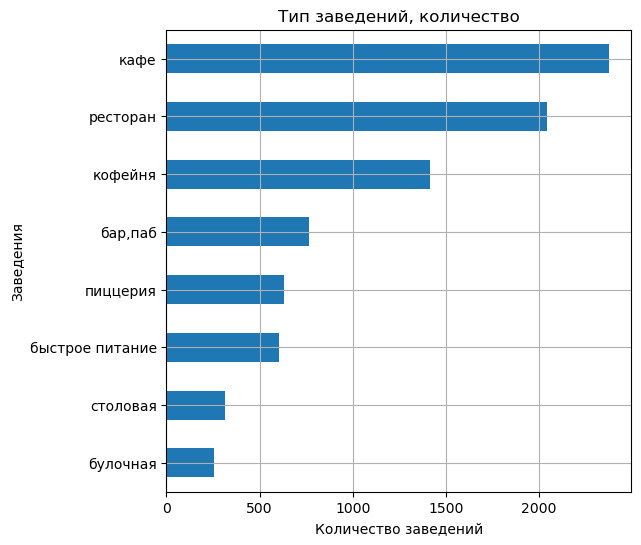

In [14]:
rest.sort_values().plot(kind='barh', 
          figsize=(6,6))
plt.title('Тип заведений, количество')
plt.xlabel('Количество заведений')
plt.ylabel('Заведения')
plt.grid()

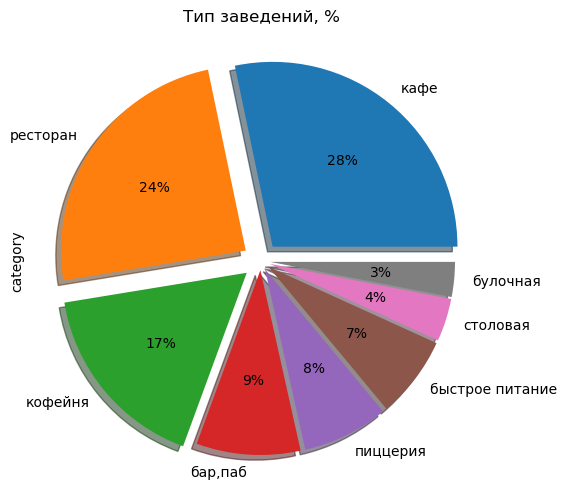

In [15]:
rest.plot(kind='pie', 
          figsize=(6,6), 
          autopct='%1.0f%%', 
          explode = (0.1, 0.1, 0.1, 0.05, 0.05, 0.05, 0.05, 0.05),
         shadow=True)
plt.title('Тип заведений, %')
plt.show()

**Вывод по разделу** 69% заведений - это кафе (28%), ресторан (24%), кофейня(17%). На остальные виды заведений приходится 31%, при этом там представлены 5 различных видов точек общепита.

### Посадочные места
Проанализируем количество посадочных мест по категориям

In [16]:
rest_seats=data.groupby('category')['seats'].median().sort_values(ascending=False)
rest_seats

category
ресторан           86.0
бар,паб            82.0
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

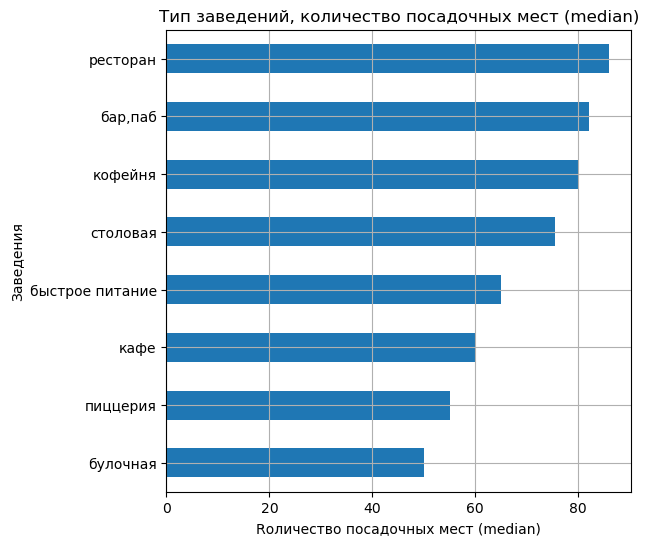

In [17]:
rest_seats.sort_values().plot(kind='barh', 
          figsize=(6,6))
plt.title('Тип заведений, количество посадочных мест (median)')
plt.xlabel('Rоличество посадочных мест (median)')
plt.ylabel('Заведения')
plt.grid()

**Вывод по разделу** Медианное значение посадочных мест по заведениям, в целом, различается не сильно. 
- лидер по медианным значениям посадочных мест является категория *ресторан* - 86
- незначительно отстают *бар/паб*, *кофейня* - 82, 80 соответственно
- меньше всего посадочных мест в *пицерии* и *булочной* - 55 и 50

### Cетевые заведения

### Cетевые заведения

In [18]:
print('Из', len(data['name']), 'заведений' , data['chain'].sum(), 'являются сетевыми')

Из 8402 заведений 3203 являются сетевыми


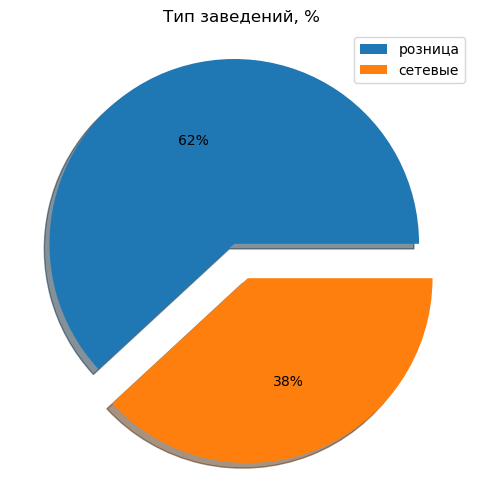

In [19]:
data['chain'].value_counts().plot(kind='pie', 
                                  labels=['розница', 'сетевые'],
                                  legend=True,
                                  ylabel='',
                                  labeldistance=None,
                                  figsize=(6,6), 
                                  autopct='%1.0f%%', 
                                  explode = (0.1, 0.1),
                                 shadow=True)
plt.title('Тип заведений, %')
plt.show()

38% рынка занимают сетевые точки.

Внутри категорий распределение на сетевые и не сетевые выглядит так:

In [20]:
#сетевые заведения по именам
rest_name=data.pivot_table(index = 'category',
                            values = 'name',
                            aggfunc = 'count')
#сетевые заведения по категориям
rest_chain=data.query('chain == 1').pivot_table(index = 'category',
                            values = 'chain',
                            aggfunc = 'count').sort_values(by = 'chain', ascending = False)


rest_name_chain = rest_name.merge(rest_chain, how='left', on='category').sort_values(by = 'chain', ascending = False).reset_index()
rest_name_chain['percent'] = round(rest_name_chain['chain']/rest_name_chain['name']*100, 1)


rest_name_chain

,category,name,chain,percent
0,кафе,2376,779,32.8
1,ресторан,2042,729,35.7
2,кофейня,1413,720,51.0
3,пиццерия,633,330,52.1
4,быстрое питание,603,232,38.5
5,"бар,паб",764,168,22.0
6,булочная,256,157,61.3
7,столовая,315,88,27.9


Столбец **[percent]** показывает какой процент внутри каждой категории занимают сетевые точки

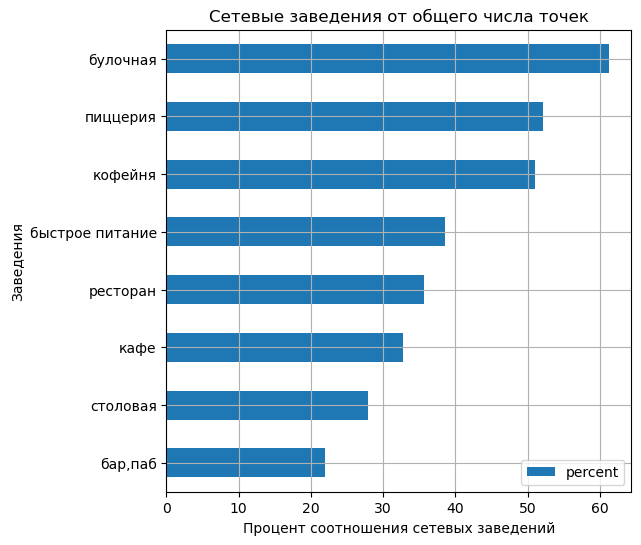

In [21]:
rest_name_chain.sort_values(by='percent').plot(kind='barh',
          figsize=(6,6),
          y='percent',
          x='category'
          )

plt.title('Сетевые заведения от общего числа точек')
plt.xlabel('Процент соотношения сетевых заведений')
plt.ylabel('Заведения')
plt.grid()
plt.show()

Обратим внимание, что сетевые булочные, пицерии и кофейни занимают больше 50% от количества себе подобных заведений.
Наименьшее количество сетевых заведений в категории бар/паб (22,1%), столовая (27,9%). Здесь доля сетевых точек не дотягивает до 1/3

Рассмотрим, как внутри сетевые заведения распределяются по категориям

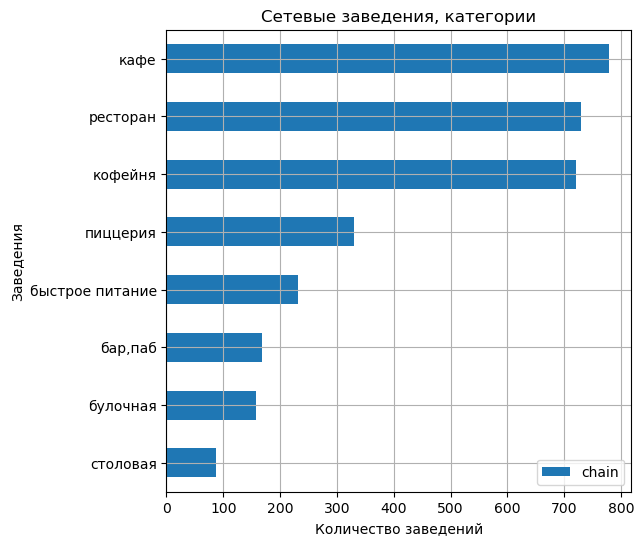

In [22]:
rest_name_chain.sort_values(by='chain').plot(kind='barh',
          figsize=(6,6),
          y='chain',
          x='category'
          )

plt.title('Сетевые заведения, категории')
plt.xlabel('Количество заведений')
plt.ylabel('Заведения')
plt.grid()
plt.show()

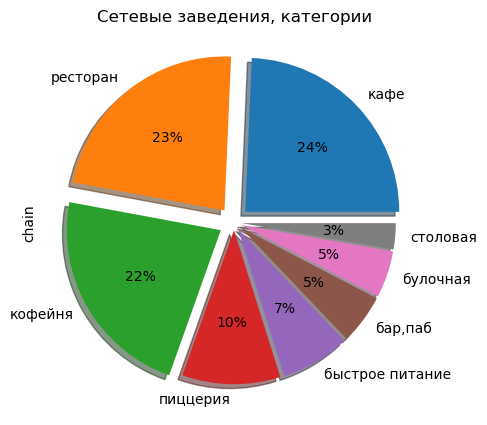

In [23]:
rest_name_chain.plot(kind='pie',
                         y='chain',
                         figsize=(5,5),
                         labels=rest_name_chain['category'],
                         autopct='%1.0f%%',
                         explode = (0.1, 0.1, 0.1, 0.05, 0.05, 0.05, 0.05, 0.05),
                         shadow=True,
                         legend=False
                        )

plt.title('Сетевые заведения, категории')
plt.show()

**Выводы по разделу** Внутри сетевых заведений распределение по типу, примерно такое же, как и в несетевых.
69% приходится на ту же тройку - кафе/ресторан/кофейня. Однако лидером явлются кафе.

### TOP15 сетевых заведений
Определим ТОР15 среди сетевых заведений по количеству точек

In [24]:
rest_chain_uniq=data[data['chain']==1]['name'].value_counts().head(15)
rest_chain_uniq

шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
cofefest                                32
буханка                                 32
му-му                                   27
Name: name, dtype: int64

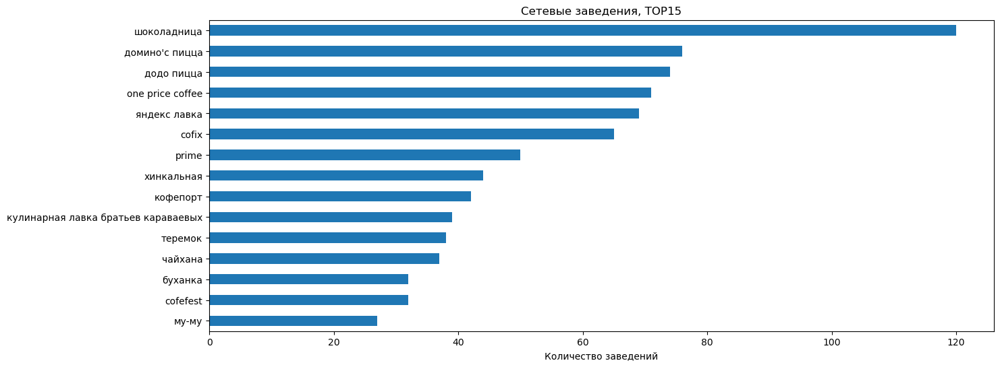

In [25]:
rest_chain_uniq.sort_values(ascending=True).plot(kind='barh',
                                                 figsize=(15,6)
                                                  )

plt.title('Сетевые заведения, ТОР15')
plt.xlabel('Количество заведений')
plt.show()

ТОP15 заведений мы обозначили. Лидером по количеству точек является сеть кофеен "Шоколадница" - 120 точек. Сразу за ней идут две сети пиццерий - Домино'с Пицца (76 точек) и Додо Пицца (74 точки)

Объеденим сетевые точки по типу заведений, и посмотрим, как они представленны внутри групп.

In [26]:
#формируем вспомогательную таблицу
rest_chain_1=data.loc[:,['name','category','chain']] 
#собираем только сетевые точки, группируем по количеству точек и оставляем TOP15
rest_chain_1=rest_chain_1[rest_chain_1['chain']==1].groupby(['name', 'category']).count().sort_values('chain', ascending=False).head(15)
#группируем по типу заведения, находим количество заведений по типу
res1=rest_chain_1.groupby('category').count().sort_values(by='chain', ascending=False).reset_index()
#группируем по типу заведения, находим количество точек каждого типа
res2=rest_chain_1.groupby('category').sum().sort_values(by='chain', ascending=False).reset_index()
#объединяем обе таблицы, переименовываем столбцы
res3=res1.merge(res2, on='category')
res3.rename(columns={'chain_x':'chain_count', 'chain_y':'chain_sum'}, inplace = True)
res3

,category,chain_count,chain_sum
0,кофейня,6,350
1,кафе,3,89
2,ресторан,3,154
3,пиццерия,2,150
4,булочная,1,25


In [27]:
rest_chain_2=rest_chain_1.groupby(['category', 'name']).sum()
rest_chain_2

chain
category name                                      
булочная буханка                                 25
кафе     drive café                              24
         кулинарная лавка братьев караваевых     39
         чайхана                                 26
кофейня  cofefest                                31
         cofix                                   65
         one price coffee                        71
         кофемания                               22
         кофепорт                                42
         шоколадница                            119
пиццерия додо пицца                              74
         домино'с пицца                          76
ресторан prime                                   49
         теремок                                 36
         яндекс лавка                            69

В Топ15 попали не все типы заведений, в частности отсутствуют заведения категорий **быстрое питание**, **бар/паб** и **столовая**.

Посмотрим среднее количество точек на сеть

In [28]:
res3['ratio']=round(res3['chain_sum']/res3['chain_count'],0)
res3

,category,chain_count,chain_sum,ratio
0,кофейня,6,350,58.0
1,кафе,3,89,30.0
2,ресторан,3,154,51.0
3,пиццерия,2,150,75.0
4,булочная,1,25,25.0


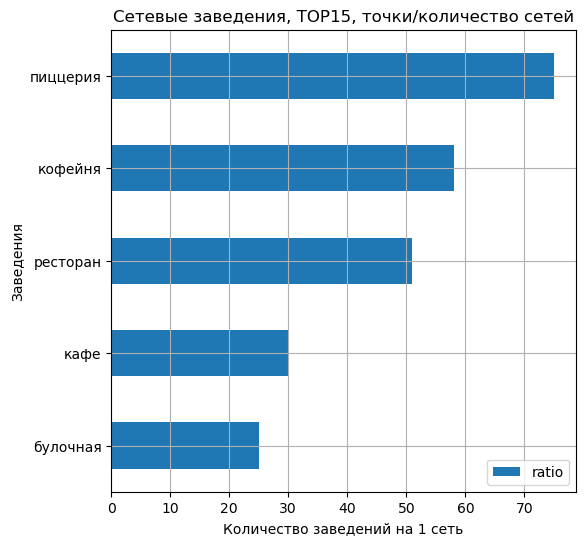

In [29]:
res3.sort_values(by='ratio').plot(kind='barh',
          figsize=(6,6),
          y='ratio',
          x='category'
          )

plt.title('Сетевые заведения, ТОР15, точки/количество сетей')
plt.xlabel('Количество заведений на 1 сеть')
plt.ylabel('Заведения')
plt.grid()
plt.show()

Вывод по разделу 
- Лидером по количеству точек является сеть кофеен "Шоколадница" - 120 точек. 
- Домино'с Пицца (76 точек)
- Додо Пицца (74 точки)

В Топ15 отсутствуют заведения категорий *быстрое питание*, *бар/паб* и *столовая*.

Среди Топ15 количество сетей и количество в них точек распределилось следующим образом

Формат **пиццерия**
- 2 сети, но самое большое количество точек, в среднем 75. Между сетями небольшой разброс - 74 и 76 точек.

Формат **кофейня**
- 6 сетей, самая большая представленность, в среднем в сети 58 точек, если брать медианное значение, то тогда количество точек в сети равно 54.

Формат **ресторан**
- 3 сети, среднее количество точек - 51, медианное - 49

Формат **кафе**
- 3 сети, среднее количество точек - 30, медианное -26

Формат **булочная**
-  1 сеть, самое маленькое количество точек - 25. 

### Заведения по районам (административным округам)


In [30]:
print ('Представлено', data['district'].nunique(), 'административных округов. ')

Представлено 9 административных округов. 


In [31]:
d1=data['district'].unique()
d1

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [32]:
print('Всего в Москве 12 АО, в анализе отсутствуют данные по Зеленоградскому, Троицкому и Новомосковскому АО (новые районы, появились в 2012 году)')

Всего в Москве 12 АО, в анализе отсутствуют данные по Зеленоградскому, Троицкому и Новомосковскому АО (новые районы, появились в 2012 году)


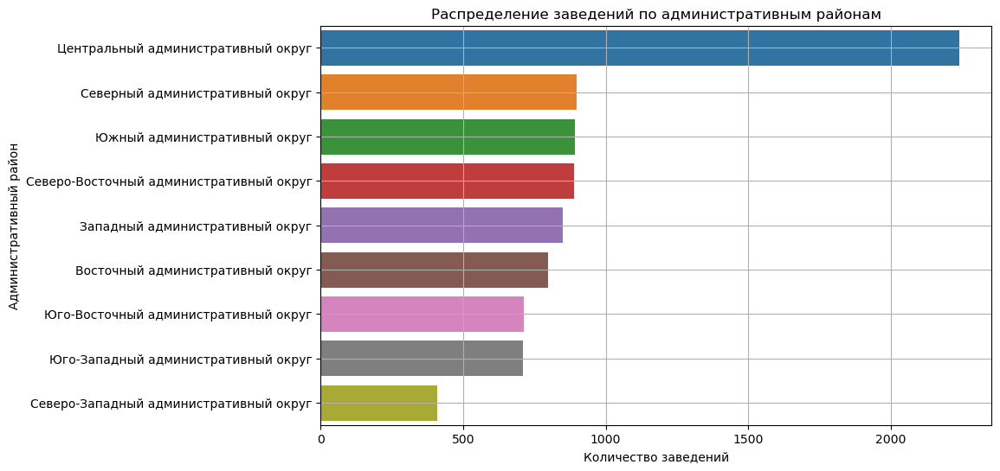

In [33]:
distr1=data.pivot_table( 
               index='district',
               values= 'name',  
               aggfunc='count').sort_values(by='name', ascending=False).reset_index()


plt.figure(figsize=(10, 6))
sns.barplot(x = 'name', y = 'district', data = distr1)
plt.title('Распределение заведений по административным районам')
plt.xlabel('Количество заведений')
plt.ylabel('Административный район')
plt.grid()
plt.show()



In [34]:
#теперь разделим их на категории
district_category = data.groupby(['district', 'category']).agg(count=('category', 'count')).reset_index()
fig = px.bar(district_category.sort_values(by='count', ascending=False), 
             x='district', 
             y='count', 
             color='category'
            )
fig.update_layout(title='Количество заведений каждой категории по административным округам (АО)',
                  xaxis_title='Административный округ',
                  yaxis_title='Количество заведений',
                  height=700,
                  width=1000,
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод по разделу** В датасете представленны данные по 9 из 12 АО Москвы. Отстуствуют данные по "новым" АО, которые добавились после 2012 года.

Наибольшее количество заведений общественного питания находится в Центральном административном округе - более 2,5 тыс.
Наименьшее количество заведений общественного питания - в С-Западном АО - менее 500

По категориям - наибольшее количество ресторанов находится в ЦАО - 670, затем идут кафе - 464. В других АО - лидерами являются кафе, а уже затем - рестораны.

Меньше всего заведений столовых и булочных

### Рейтинги заведений

Рассмотрим усреднённые рейтинги по заведениям


In [35]:
#заведения по рейтингам
rest_rating=data.pivot_table(index = 'category',
                            values = 'rating',
                            aggfunc = 'mean').reset_index().sort_values(by='rating', ascending=False)
rest_rating

,category,rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124285
2,быстрое питание,4.050249


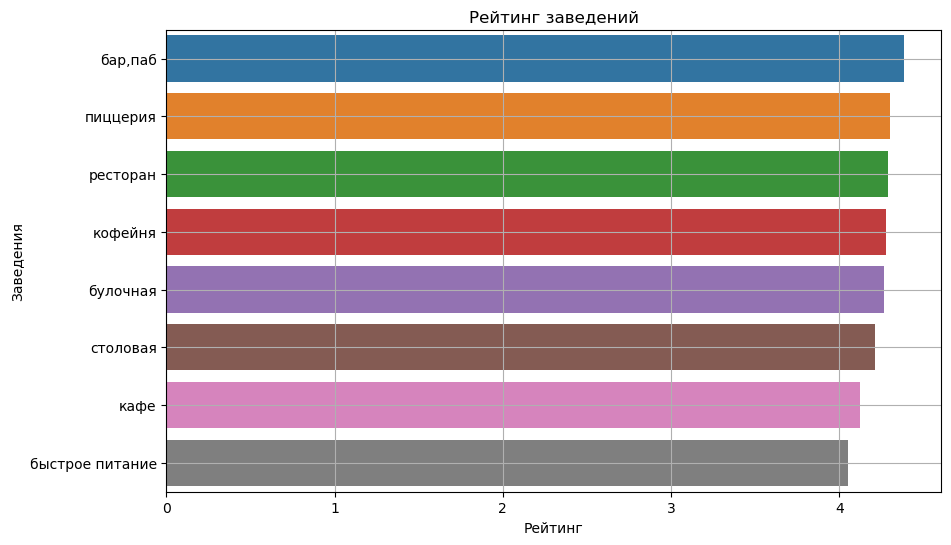

In [36]:
plt.figure(figsize=(10, 6))
sns.barplot(x = 'rating', y = 'category', data = rest_rating)
plt.title('Рейтинг заведений')
plt.xlabel('Рейтинг')
plt.ylabel('Заведения')
plt.grid()
plt.show()

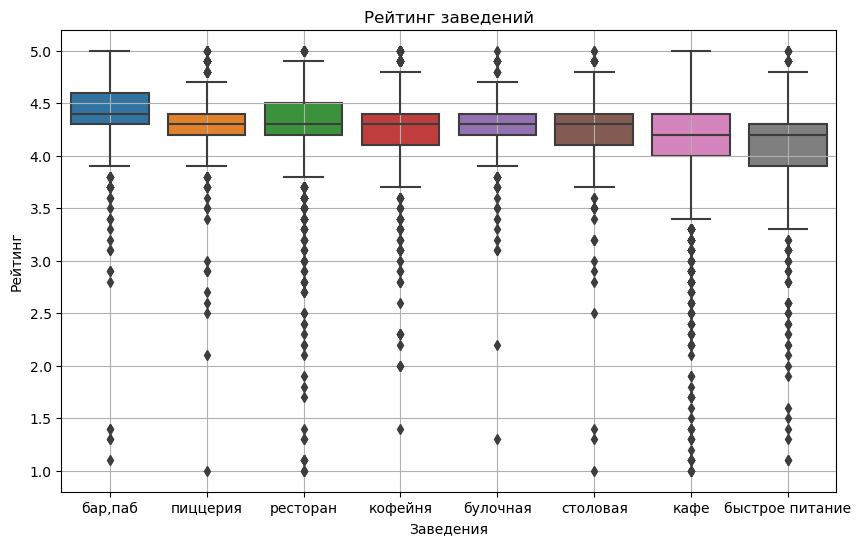

In [37]:
order = data.groupby('category')['rating'].mean().sort_values(ascending=False).index
plt.figure(figsize=(10, 6))
sns.boxplot(x='category', y='rating', data=data, order=order) 

plt.title('Рейтинг заведений')
plt.xlabel('Заведения')
plt.ylabel('Рейтинг')
plt.grid()
plt.show()

**Вывод по разделу** 
- самый высокий рейтинг 4,39 - у заведений *бар,паб*
- самый низкий рейтинг 4,05 - у заведений *быстрое питание*

- самый большой разброс по рейтингу - у *кафе* (от 3,4 до 5,0) и *быстрое питание* (3,3-4,8) .
- самый маленький - у *пицерии* и *булочная* (3,9-4,7)

У кафе, ресторанов и заведений быстрого питания так же можно отметить большое количество оценок, поставленных ниже первого квартеля, вплоть до 1,0. Говорит о том, что среди заведений такого типа сильна конкуренция, и посетители, что называется, "голосуют ногами" и, в случаи каких-либо неудовлетворительных нюансов, отмечают завдения низкими рейтинговыми оценками.


### Карта заведений, рейтинг (хороплет)

Составим карту москвы с заведенями общественного питания, исходя из рейтингов

In [38]:
distr_rating = data.groupby('district').agg(mean_rating=('rating', 'mean')).sort_values(by='mean_rating', ascending=False).reset_index()

# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
except:
    state_geo = '/datasets/admin_level_geomap.geojson'
    

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=distr_rating,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='Accent',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

**Вывод по разделу** 
- самый высокий средний рейтинг - у заведений Центрального административного округа (~ 4.38)
- cамые низкие средние рейтинги - у заведений Юго-Восточного административных округ (~ 4.1). 
- средний рейтинг остальных округов составил ~ 4.15 - 4.24

### Карта заведений, точки

In [39]:
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=16, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

### TOP 15 улиц, количество заведений


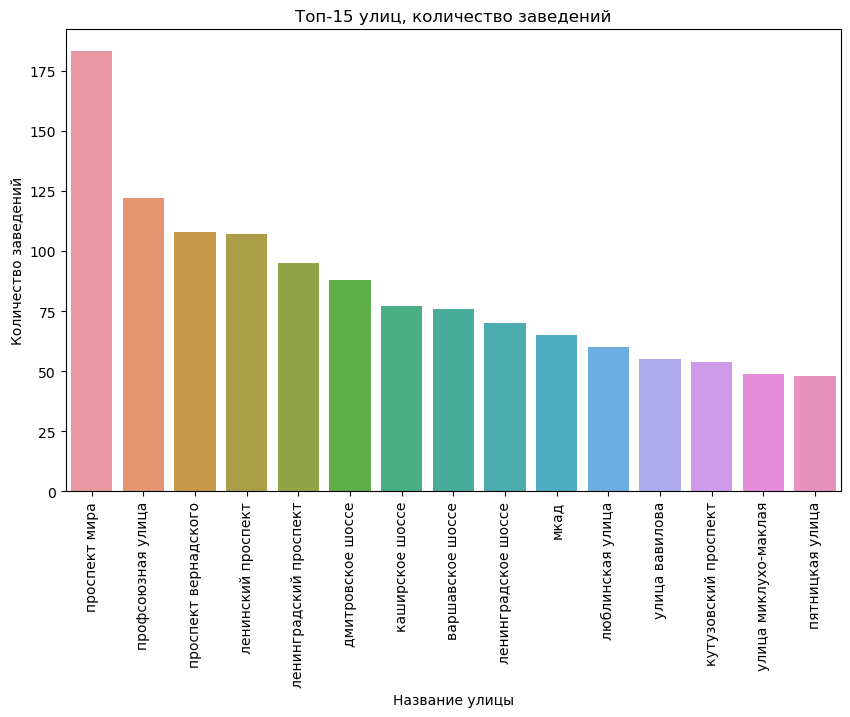

In [40]:
top_street_rest = data.pivot_table(index = 'street',
                                 values = 'name', 
                                 aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index().head(15)
plt.figure(figsize=(10, 6))
sns.barplot(x = 'street', y = 'name', data = top_street_rest)
plt.title('Топ-15 улиц, количество заведений')
plt.xlabel('Название улицы')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

In [41]:
street = top_street_rest['street']
street_category = data.query("street in @street").groupby(['street', 'category']).agg(count=('category', 'count')).reset_index()

fig = px.bar(street_category.sort_values(by='count', ascending=False), 
             x='street', 
             y='count', 
             color='category')
fig.update_layout(title='Топ-15 улиц, количество заведений по категориям',
                  xaxis_title='Название улиц',
                  yaxis_title='Количество заведений',
                  height=800,
                  width=800,
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод по разделу** В ТОР15 улиц
- самое большое количество заведений - на проспекте Мира. Это кафе (53), рестораны (45), кофейни (36);
- меньше всего заведений на Пятницкой улице. Рестораны (18), кофе (7, кофейни (6);
- отдельно - МКАД - на нем расположено 45 кафе, примерно столько же, сколько на проспекте Мира
- бар/паб-ов больше всего на Ленинградском проспекте (15)




### Улицы с 1 заведением
Найдем улицы, на которых находится 1 заведение общественного питания

In [42]:
street_one_rest = data.pivot_table(index = 'street', 
                                 values = 'name', 
                                 aggfunc = 'count').query("name == 1").reset_index()
one_rest_street = street_one_rest['street']
street_one = data.query("street in @one_rest_street")
street_one

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица шкулёва,False
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица артюхиной,False
8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,кузьминская улица,False
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,новороссийская улица,False


In [43]:
print('Всего улиц, на которых расположено по 1 заведению ощепита -', len(street_one['name']))

Всего улиц, на которых расположено по 1 заведению ощепита - 457


Рассмотрим, как они распределяются по категориям

In [44]:
street_one.pivot_table(index = 'category', 
                       values = 'name', 
                       aggfunc = 'count').reset_index().sort_values(by = 'name', ascending=False)

,category,name
3,кафе,159
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


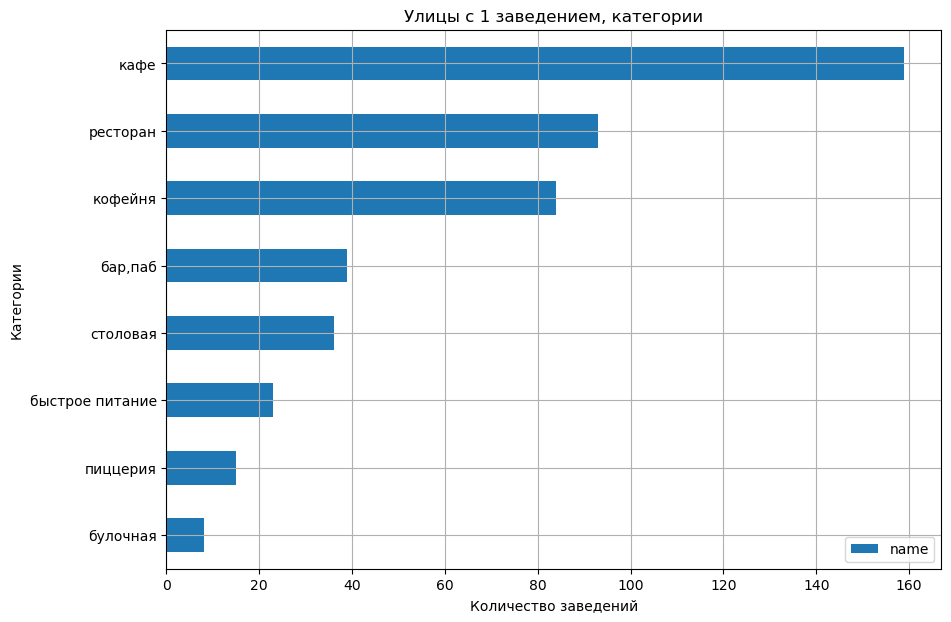

In [45]:
street_one.pivot_table(index = 'category', 
                       values = 'name', 
                       aggfunc = 'count').sort_values(by = 'name').plot(kind = 'barh', figsize=(10, 7))
plt.title('Улицы с 1 заведением, категории')
plt.ylabel('Категории')
plt.xlabel('Количество заведений')
plt.grid()
plt.show()

Рассмотрим, как распологаются улицы с 1 заведением по АО

In [46]:
street_one.pivot_table(index = 'district', 
                       values = 'name', 
                       aggfunc = 'count').sort_values(by = 'name', ascending=False).reset_index()

,district,name
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,51
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


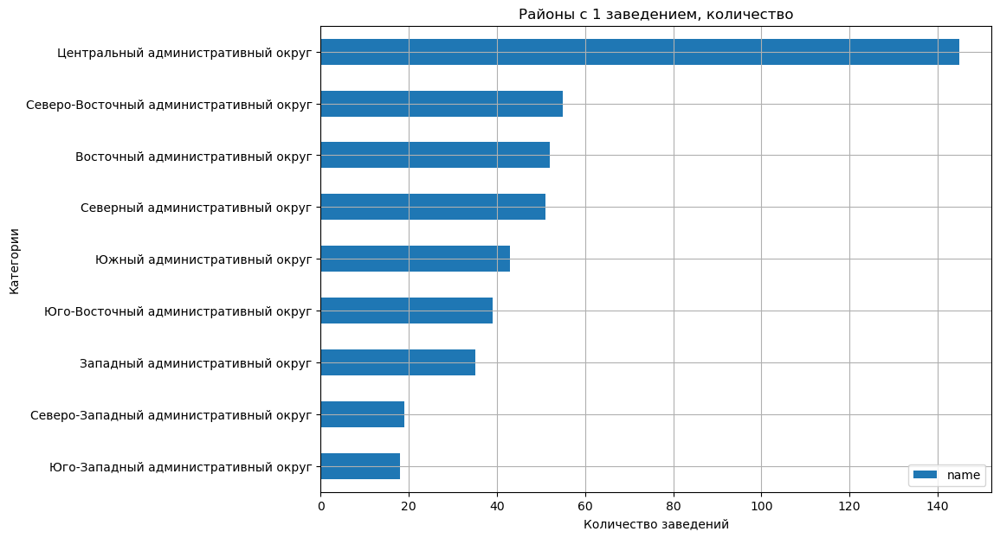

In [47]:
street_one.pivot_table(index = 'district', 
                       values = 'name', 
                       aggfunc = 'count').sort_values(by = 'name').plot(kind = 'barh', figsize=(10, 7))
plt.title('Районы с 1 заведением, количество')
plt.ylabel('Категории')
plt.xlabel('Количество заведений')
plt.grid()
plt.show()

**Вывод по разделу** 

В Москве 457 улиц, на которых расположено по 1 заведению общепита.
- 145 таких улиц находится в Центральном АО
- меньше всего таких улиц - в Северо-Западном и Юго-Западном АО (19 и 18 соответсвенно)

Если рассматривать по категориям, то
- большинство таких заведений - это кафе 159
- меньше всго - булочные 8

### Средний чек, районы (хороплет)

In [48]:
dm=round(data.pivot_table(index='district',
                   values='middle_avg_bill',
                   aggfunc= 'median'
                   ).reset_index().sort_values(by='middle_avg_bill', ascending=False),2)
dm

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dm,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Accent',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод по разделу**
- самый высокий чек - в Западном и Центральном АО, составляет 1000,00 руб.
- самый низкий - в Северо-Восточном, Южном и Юго-Восточном АО - 500,00 руб., 500,00 руб. и 450,0 руб. соответственно

Так же можно отметить, что не существует линейной зависимости изменения цены, при удалении от центра Москвы. В частности, у Центрального и Западного АО средний чек равен 1000,00 руб., но в составе Западного АОнаходятся удаленные районы (аэропорт Внуково, Сколково, Толстопальцево)

### Вывод по разделу

Мы проанализировали как распределены заведения общественного питания г.Москва в разрезе:
1. Категории заведения:  69% заведений - это кафе (28%), ресторан (24%), кофейня(17%). На остальные виды заведений приходится 31%, при этом там представлены 5 различных видов точек общепита.


2. По медианному значению количество посадочных мест примерно одинаково. Лидируют рестораны, бар/пабы, кофейни и столовые


3. При этом 38% от общего количества заведений являются сетевыми.


4. Среди сетевых заведений распределение по типу, примерно такое же, как и в несетевых. 69% приходится на ту же тройку - кафе/ресторан/кофейня. Однако лидером явлются кафе.


5. В ТОP15 сетевых лидером по количеству точек является сеть кофеен "Шоколадница" - 120 точек. Сразу за ней идут две сети пицерий - Домино'с Пицца (76 точек) и Додо Пицца (74 точки). В Топ15 отсутствуют заведения категорий *быстрое питание, бар/паб и столовая.*


6. В датасете представленны данные по 9 из 12 АО Москвы. Наибольшее количество заведений общественного питания находится в Центральном административном округе - более 2,5 тыс., наименьшее количество заведений общественного питания - в С-Западном АО - менее 500. По категориям - наибольшее количество ресторанов находится в ЦАО - 670, затем идут кафе - 464. В других АО - лидерами являются кафе, а уже затем - рестораны. Меньше всего заведений столовых и булочных


7. Самый высокий рейтинг 4,39 - у заведений бар,пабб; самый низкий рейтинг 4,05 - у заведений быстрое питание.У кафе, ресторанов и заведений быстрого питания так же можно отметить большое количество оценок, поставленных ниже первого квартеля, вплоть до 1,0. Говорит о том, что среди заведений такого типа сильна конкуренция, и посетители, что называется, "голосуют ногами" и, в случаи каких-либо неудовлетворительных нюансов, отмечают заведения низкими рейтинговыми оценками.


8. Самый высокий средний рейтинг - у заведений Центрального административного округа (~ 4.38), cамые низкие средние рейтинги - у заведений Юго-Восточного административных округf (~ 4.1), средний рейтинг остальных округов составил ~ 4.15 - 4.24


9. Самое большое количество заведений - на проспекте Мира. Это кафе (53), рестораны (45), кофейни (36). Меньше всего заведений на Пятницкой улице. Рестораны (18), кофе (7, кофейни (6). Отдельно можно отметить МКАД - на нем расположено 45 кафе, примерно столько же, сколько на проспекте Мира. Так же большое количество бар/паб-ов - на Ленинградском проспекте (15)


10. Невозможно одназначно утверждать о линейной зависимости величины среднего чека при удалении от центра Москвы. Самый высокий чек - в Центральном и Западном АО, составляет 1000,00 руб., самый низкий - в в Северо-Восточном, Южном и Юго-Восточном АО - 500,00 руб., 500,00 руб. и 450,0 руб. соотвественно

## Открытие кофейни. Исследование

### Описание задачи
Фонд «Shut Up and Take My Money» предполагает открыть стильную и доступную кофейню в Москве. 
Необходимо проанализировать ситуацию, для этого ответим на следующие впросы:
1. Количество кофеен
2. Распределение кофеен по районам (АО)
3. Показатели кофеен:
    - график работы;
    - рейтинг;
    - количество посадочных мест;
    - среднийчек/стоимость 1 чашки капучино.

Эта информация может быть получена из предоставленного датасета.

### Количество кофеен

In [50]:
data_coffee=data.query("category == 'кофейня'")
data_coffee.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False


In [51]:
print('Всего в Москве', len(data_coffee['name']), 'кофеен' )

Всего в Москве 1413 кофеен


Проанализируем, как кофейни расположены по районам (АО) в г.Москва

In [52]:
data_coffee.value_counts('district')

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
dtype: int64

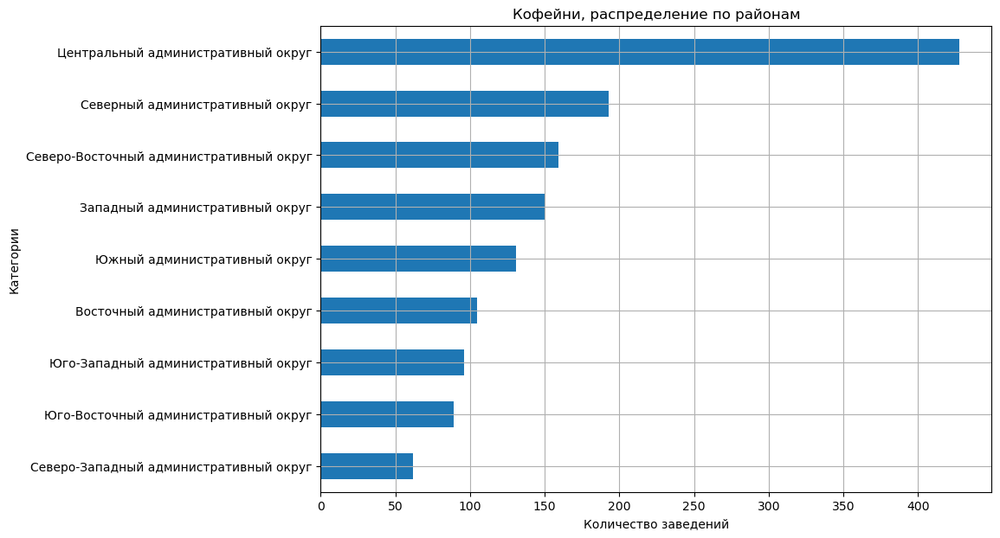

In [53]:
data_coffee.value_counts('district', ascending =True).plot(kind = 'barh', 
                                          figsize=(10, 7))
plt.title('Кофейни, распределение по районам')
plt.ylabel('Категории')
plt.xlabel('Количество заведений')
plt.grid()
plt.show()

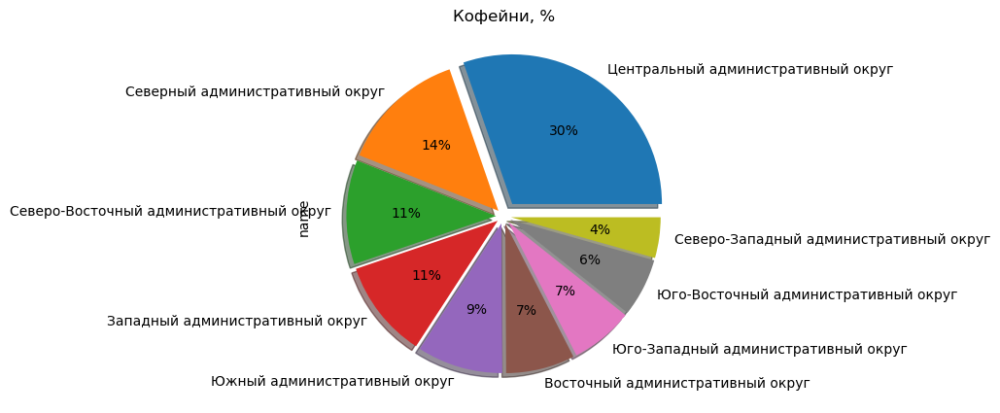

In [54]:
dc=data_coffee.pivot_table(index='district',
                   values='name',
                   aggfunc= 'count'
                   ).reset_index().sort_values(by='name', ascending=False)

dc.plot(kind='pie',
        y='name',
        labels=dc['district'],
        figsize=(5,5),
        autopct='%1.0f%%',
        explode = (0.1, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05),
        shadow=True,
        legend=False
       )

plt.title('Кофейни, %')
plt.show()


Видим, что 30% всех кофеен находится в Центральном АО. В следующем по количеству кофеен Северном АО - 14% от общего чисоа кофеен. И это более, чем в два раза меньше, чем в ЦАО.

Посмотрим, как количество кофеен отображается на хороплете

In [55]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=dc,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Accent',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

m

На хороплете хорошо видно, что в основном, исключая Центральный АО, количество кофеен варририуется от 62 до 184 на АО, исключая Северный АО.

### Показатели кофеен
Рассмотрим сколько кофеен работают круглосуточно

In [56]:
data_time=data_coffee.pivot_table(index='is_24_7',
                   values='name',
                   aggfunc= 'count'
                   ).reset_index().sort_values(by='is_24_7', ascending=False)

data_time

,is_24_7,name
1,True,59
0,False,1354


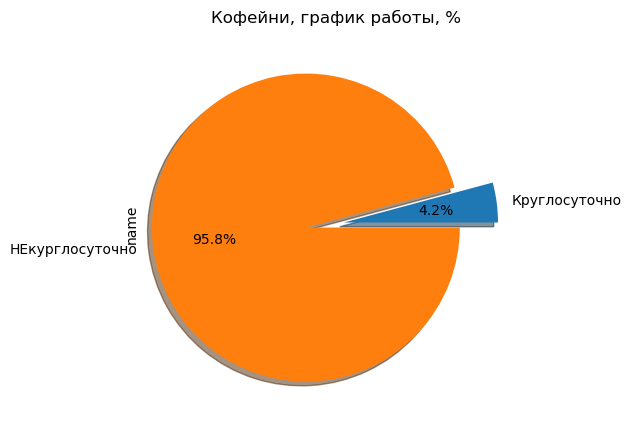

In [57]:
data_time.plot.pie(y='name',
        labels=['Круглосуточно', 'НЕкурглосуточно'],
        figsize=(5,5),
        autopct='%1.1f%%',
        explode = (0.05, 0.2),
        shadow=True,
        legend=False
       )

plt.title('Кофейни, график работы, %')
plt.show()

Всего 4,2% от всех кофеен (59 шт.) работают в круглосуточном режиме.

Рассмотрим, сколько кофеен работают круглосуточно по районам

In [58]:
data_time1=data_coffee.pivot_table(index='district',
                   values='is_24_7',
                   aggfunc= ('sum', 'count'),
                   ).reset_index()
data_time1['percent']=round(data_time1['sum']/data_time1['count']*100, 2)
data_time1.sort_values(by='percent', ascending=False)

,district,count,sum,percent
7,Юго-Западный административный округ,96,7,7.29
5,Центральный административный округ,428,26,6.07
1,Западный административный округ,150,9,6.00
0,Восточный административный округ,105,5,4.76
4,Северо-Западный административный округ,62,2,3.23
2,Северный административный округ,193,5,2.59
3,Северо-Восточный административный округ,159,3,1.89
6,Юго-Восточный административный округ,89,1,1.12
8,Южный административный округ,131,1,0.76


В ЦАО 26 кофеен работают круглосуточно, в Южном АО - всего 1.

Но при этом в Юго-Западном районе 7,29% кофеен работает в круглосуточном режиме, а в ЦАО - только 6,07%. В Южном АО - всего 0,76%

Рейтинг работы кофен в разных районах

In [59]:
data_rating=round(data_coffee.pivot_table(index='district',
                   values='rating',
                   aggfunc= 'mean'
                   ).reset_index().sort_values(by='rating', ascending=False),
                  2)
data_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


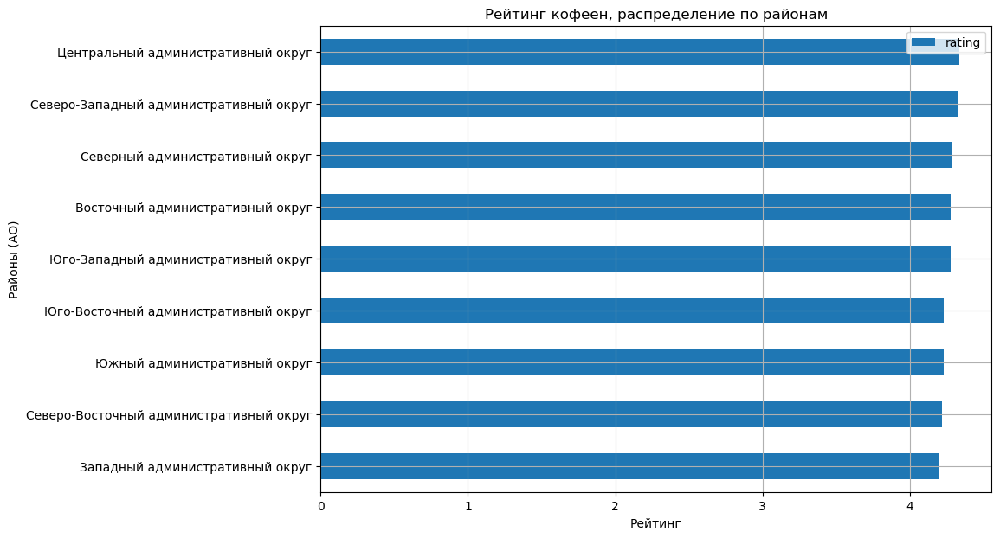

In [60]:
data_rating.sort_values(by='rating').plot(kind = 'barh', 
                         y='rating',
                         x='district',
                         figsize=(10, 7)
                        )
plt.title('Рейтинг кофеен, распределение по районам')
plt.ylabel('Районы (АО)')
plt.xlabel('Рейтинг')
plt.grid()
plt.show()

Рейтинги у всех кофеен  в среднем примерно одинаковые, самый выскоий у кофеен Центрального АО - 4,34, самый низкий - у Западного административного округа - 4,2.

Рассмотрим черз boxplot

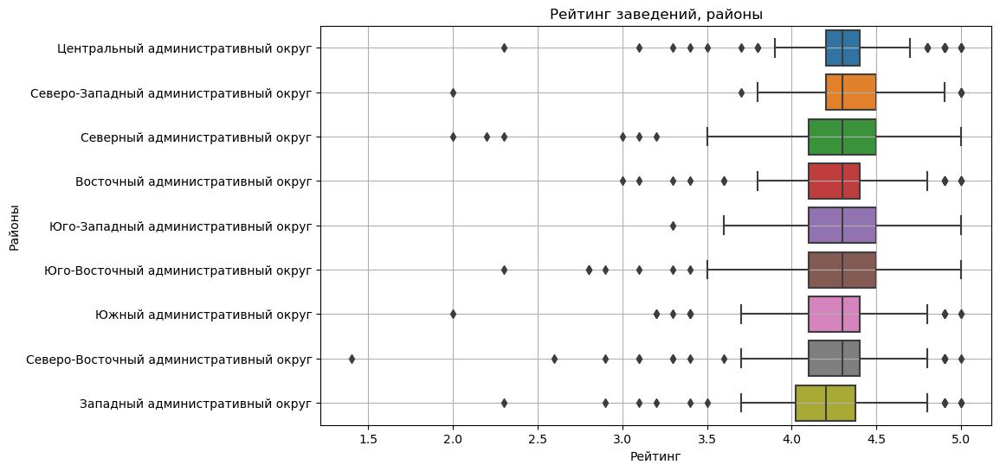

In [61]:
order = data_rating.groupby('district')['rating'].mean().sort_values(ascending=False).index
plt.figure(figsize=(10, 6))
sns.boxplot(x='rating', y='district', data=data_coffee, order=order) 

plt.title('Рейтинг заведений, районы')
plt.xlabel('Рейтинг')
plt.ylabel('Районы')
plt.grid()
plt.show()

На диаграмме видно, что в среднем выбросы (как низкие, так и высокие оценки), расположенные в 1 и 4 квартилях расположены в границах от 2,0 до 5,0.

Выбросы ниже 2,0 есть только у одного района - Северо-Восточного АО. 

Так же можно отметить, что есть 3 района Северный АО, Юго-Восточный и Юго-Западный АО, в которых границей 4 квартиля является значение рейтинга равное 5,0

Рассмотрим медианное количество посадочных мест

In [62]:
data_seats=round(data_coffee.pivot_table(index='district',
                   values='seats',
                   aggfunc= 'mean'
                   ).reset_index().sort_values(by='seats', ascending=False), 2)
data_seats

,district,seats
1,Западный административный округ,153.33
8,Южный административный округ,124.97
2,Северный административный округ,117.28
5,Центральный административный округ,113.15
0,Восточный административный округ,97.44
3,Северо-Восточный административный округ,92.13
4,Северо-Западный административный округ,87.35
7,Юго-Западный административный округ,86.61
6,Юго-Восточный административный округ,70.92


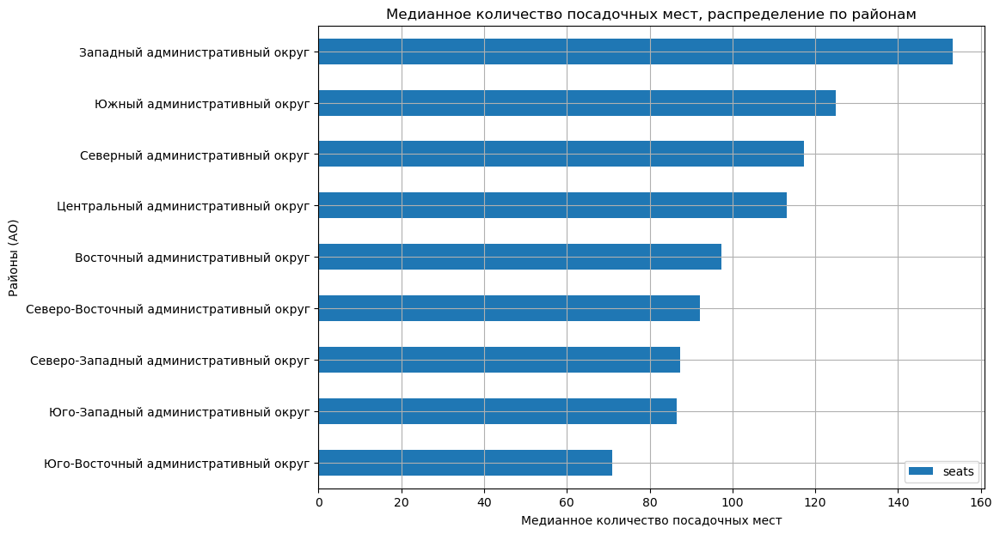

In [63]:
data_seats.sort_values(by='seats').plot(kind = 'barh', 
                         y='seats',
                         x='district',
                         figsize=(10, 7)
                        )
plt.title('Медианное количество посадочных мест, распределение по районам')
plt.ylabel('Районы (АО)')
plt.xlabel('Медианное количество посадочных мест')
plt.grid()
plt.show()

Самое большое количество медианных посадочных мест - в Западном АО (153,33)

Меньше всего в Юго-Восточном АО (70,92)

Рассмотрим, какой средний чек может быть получен в кофейне, исходя из её местоположения

In [64]:
data_middle_avg_bill=round(data_coffee.pivot_table(index='district',
                   values='middle_avg_bill',
                   aggfunc= 'mean'
                   ).reset_index().sort_values(by='middle_avg_bill', ascending=False), 2)
data_middle_avg_bill

,district,middle_avg_bill
5,Центральный административный округ,794.76
1,Западный административный округ,694.44
8,Южный административный округ,504.78
2,Северный административный округ,495.74
0,Восточный административный округ,486.11
4,Северо-Западный административный округ,440.64
3,Северо-Восточный административный округ,433.16
7,Юго-Западный административный округ,381.82
6,Юго-Восточный административный округ,263.00


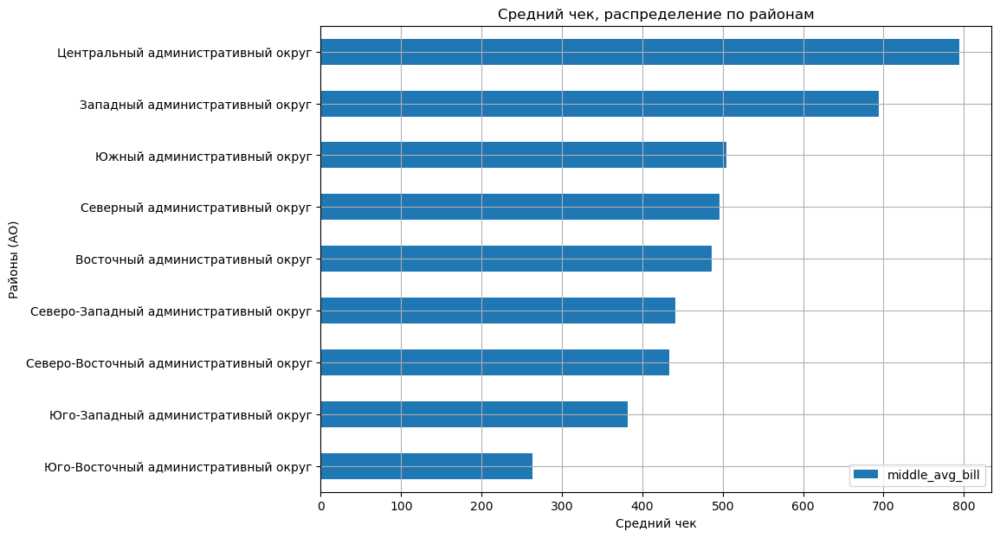

In [65]:
data_middle_avg_bill.sort_values(by='middle_avg_bill').plot(kind = 'barh', 
                         y='middle_avg_bill',
                         x='district',
                         figsize=(10, 7)
                        )
plt.title('Средний чек, распределение по районам')
plt.ylabel('Районы (АО)')
plt.xlabel('Средний чек')
plt.grid()
plt.show()

Самый большой средний чек в кофейнях - в Центральном административном округе - 794,76 руб.

Минимальный средний чек - в Юго-Восточном АО - 263,00 руб. - в 3 раза меньше, чем в ЦАО!

Рассморим ещё один такой показатель, как средняя стоимость 1 чашки капучино

In [66]:
data_middle_coffee_cup=round(data_coffee.pivot_table(index='district',
                   values='middle_coffee_cup',
                   aggfunc= 'mean'
                   ).reset_index().sort_values(by='middle_coffee_cup', ascending=False), 2)
data_middle_coffee_cup

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


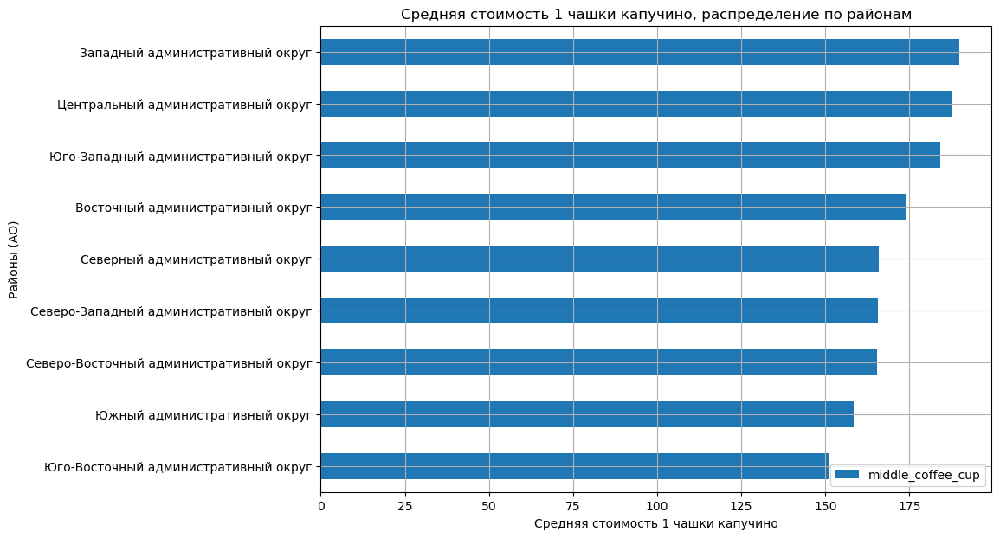

In [67]:
data_middle_coffee_cup.sort_values(by='middle_coffee_cup').plot(kind = 'barh', 
                         y='middle_coffee_cup',
                         x='district',
                         figsize=(10, 7)
                        )
plt.title('Средняя стоимость 1 чашки капучино, распределение по районам')
plt.ylabel('Районы (АО)')
plt.xlabel('Средняя стоимость 1 чашки капучино')
plt.grid()
plt.show()

Самый дорогой капучино в Западном АО - 189,94 р., немного уступает Центральный АО - 187,52 руб

Самый дешевый капучино - в Юго-Восточном АО - 151,09 руб



### Вывод по разделу

Итак, мы рассмотрели достаточно количественных и качественных показателей, для того, чтобы сделать вывод о том, в каком районе открытие кофейни может принести условно-большую прибыль. Сведем полученную информацию следующим образом:
- percent - отношение медианной стоимости 1 чашки капучино к медианному среднему чеку;
- seats - медианное количество посадочных мест;
- rating - медианное значение рейтинга кофеен.

Перемножим эти показатели и получим коэффициент s.

In [68]:
data_coffee_all=data_coffee.pivot_table(index='district',
                   values=('rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats'),
                   aggfunc= 'mean').reset_index()
data_coffee_all['percent']=round(data_coffee_all['middle_coffee_cup']/data_coffee_all['middle_avg_bill'],2)
data_coffee_all['s']=data_coffee_all['percent']*data_coffee_all['rating']*data_coffee_all['seats']
data_coffee_all.sort_values(by='s', ascending=False)

,district,middle_avg_bill,middle_coffee_cup,rating,seats,percent,s
7,Юго-Западный административный округ,381.818182,184.176471,4.283333,86.607143,0.48,178.064286
1,Западный административный округ,694.444444,189.938776,4.195333,153.329670,0.27,173.682651
6,Юго-Восточный административный округ,263.000000,151.088235,4.225843,70.923077,0.57,170.834567
2,Северный административный округ,495.736842,165.789474,4.291710,117.281818,0.33,166.102046
8,Южный административный округ,504.777778,158.488372,4.232824,124.973333,0.31,163.986955
0,Восточный административный округ,486.111111,174.023810,4.282857,97.444444,0.36,150.242629
3,Северо-Восточный административный округ,433.157895,165.333333,4.216981,92.132530,0.38,147.638034
4,Северо-Западный административный округ,440.636364,165.523810,4.325806,87.352941,0.38,143.591328
5,Центральный административный округ,794.764706,187.518519,4.336449,113.146789,0.24,117.757256


Коэффициент **Percent** показывает отношение стоимости 1 чашки кофе к среднему чек. Чем он больше, тем меньше позиций в среднем чеке. 

*Например, при покупке кофе, клиент берет ещё десерт, воду и т.д. Если доп.продуктов немного, или они стоят недорого, то стоимость 1 чашки капучино в стоимости среднего чека становится весомой. Если кроме кофе, покупатель берет ещё много других доп.продуктов - добавки к кофе, топинги, десерт, либо стоимость десерта велика (при низкой себистоимости), то соответственно такая кофейня будет более прибыльной для заказчика.*

*С другой стороны, кофейня у которой отношение percent велико, подразумевает небольшие вложения для открытия бизнеса, т.к. по сути она занимается продажей только кофе и недорогих доп.продуктов. Для открытия такой кофейни достаточно найти место, приобрести небольшую кофемашину и обеспечить минимум доп.продуктов*

#### percent
Поэтому если мы рассматриваем коэффициент percent, как прямое отношение, как в таблице выше, то наиболее привлекательным для открытия новой кофейни является Юго-Западный административный округ. 
- высокая стоимость 1 чашки кофе - 184,18 руб, 
- при небольшом количестве посадочных мест (86,6 чел) на 1 заведение, 
- а так же высоком коэфициенте percent 0,48

делает этот район интересным для неболшой кофейни с невысоким количеством товарных позиций. 

Так же 7 из 96 кофеен в этом АО работают круглосуточно (самый большой процент круглосуточных кофеен в Москве).

По географии ЮЗАО - один из самых экологически чистых районов Москвы. Там находится большое количество зелёных зон, самыми крупными среди них являются: Битцевский лес, заказник Тёплый Стан, лесополоса Коньково, заказник лес на реке Самородинке и Бутовский лесопарк.

Кроме того, можно отметить следующие прогулочные зоны: Воронцовский парк, Коробковский сад, Ясеневский и Голубинский лесопарки.

В ЮЗАО расположены такие усадьбы, как "Васильевское", "Воронцово", "Черёмушки", "Ясенево", "Узкое" и "Знаменкое-Садки".

Помимо сказанного, Юго-Западный округ является самым «научным» в столице: в нем расположена Российская академия наук, более 160 НИИ, половина из которых — институты РАН, и большое количество столичных вузов, среди которых: РУДН, РГУ нефти и газа, РГУП и др. Отсюда, кстати, невысокий средний чек, и большое количество круглосуточных кофеен.

Так же, значительная часть ЮЗАО попадает под реновацию - наиболее старый жилой фонд можно встретить в таких районах округа, как: Котловка, Зюзино и Черёмушки. Это значит увеличение в перспективе населения.

В целом ЮЗАО - интересный район для начала работы в сфере небольших кофеен.

#### 1- percent

Рассмотрим привлекательность кофеен, с коэффициентом **1-percent** - в кофейне стоимость чашки кофе занимает незначительную долю в среднем чеке.

In [69]:
data_coffee_all=data_coffee.pivot_table(index='district',
                   values=('rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats'),
                   aggfunc= 'mean').reset_index()
data_coffee_all['1-percent']=1-round(data_coffee_all['middle_coffee_cup']/data_coffee_all['middle_avg_bill'],2)
data_coffee_all['1-s']=data_coffee_all['1-percent']*data_coffee_all['rating']*data_coffee_all['seats']
data_coffee_all.sort_values(by='1-s', ascending=False)

,district,middle_avg_bill,middle_coffee_cup,rating,seats,1-percent,1-s
1,Западный административный округ,694.444444,189.938776,4.195333,153.329670,0.73,469.586426
5,Центральный административный округ,794.764706,187.518519,4.336449,113.146789,0.76,372.897978
8,Южный административный округ,504.777778,158.488372,4.232824,124.973333,0.69,365.003223
2,Северный административный округ,495.736842,165.789474,4.291710,117.281818,0.67,337.237488
0,Восточный административный округ,486.111111,174.023810,4.282857,97.444444,0.64,267.098006
3,Северо-Восточный административный округ,433.157895,165.333333,4.216981,92.132530,0.62,240.883108
4,Северо-Западный административный округ,440.636364,165.523810,4.325806,87.352941,0.62,234.280588
7,Юго-Западный административный округ,381.818182,184.176471,4.283333,86.607143,0.52,192.902976
6,Юго-Восточный административный округ,263.000000,151.088235,4.225843,70.923077,0.43,128.875200


Здесь по привлекательности лидирует Западный АО (ЗАО)

- высокая стоимость среднего чека (694,44) при низкой доли 1 чашки кофе (0,27)
- большое количество посадочных мест (в среднем 153,32)

Здесь можно открыть большую кофейню с достаточно разнообразным меню/доп.продуктами.

ЗАО по праву считается одним из самых зелёных округов Москвы. Здесь находятся такие крупные парки, как: Москворецкий, Филёвский, Суворовский, парк Победы, парк развлечений Сказка, природный заказник долина реки Сетунь, природный заказник Воробьёвы горы, парк 50-летия Октября, парк Олимпийской деревни, Тропарёвский парк. 

Наиболее старый жилой фонд встречается в таких районах, как: Кунцево, Фили-Давыдково, Очаково, Проспект Вернадского именно здесь будет проходить реновация.

Респектабельный район привлекает крупные компании. Кутузовский проспект и проспект Вернадского усеяны бизнес-центрами и офисными зданиями. В ЗАО находятся офисы отечественных мастодонтов вроде «Газпрома» и «Росгосстраха».

Главные научные предприятия в ЗАО, если не считать вузы, — космический научно-производственный центр и инновационный центр «Сколково», первый построенный с нуля наукоград в постсоветской России.

Поэтому данный район имеет более выскоий порог для входа, за счет большего масштаба заведения. В то же время за счет выского среднего чека срок окупаемости может быть меньше.

### Вывод по исследованию

Небольшая, семейная/студенческая кофейня - как в сериале "Друзья", рекомендую рассмотреть вопрос об откурытии в Юго-Западном АО

Более крупная, респектабельная кофейня - Западный АО

## Презентация
Презентация: https://disk.yandex.ru/i/p7vyoX1xGpUYXA